<h1 style="text-align: center;"> 💳 Detecção de fraude em cartão de crédito</h1>

![cartão](https://www.cdlbm.com.br/imgs/noticia/Fraude_em_cart%C3%B5es.png)

## ✅ Sobre o projeto:

##### Contextualização do problema:

Identificar padrões de transações fraudulentas em cartão de crédito parece ser uma tarefa dificil, considerendo apenas analise humana com poucos recursos e ferramentas, encontrar padrões em dados de sobre a utilização de cartão de crédito de varios clientes parece uma otima medida para bloquerar transações fraudulentas e ma intencionadas. com isso netes projeto utilizarei uma base de dados que comentarei melhor sobre mais a frente, que contem dados de utilização de cartão classificadas em dois tipos, transação fraudada e não fraudada, representado por valores numericos, a intenção é utilizar modelos de machine learning para treinar sobre essas bases e encontrar padrões que possam predizer se a transação é uma possiivel fraude ou não.

##  ✅ Sobre o dataset:


Este dataset simulado contém transações de cartão de crédito, tanto legítimas quanto fraudulentas, registradas entre 1º de janeiro de 2019 e 31 de dezembro de 2020. Ele abrange transações realizadas por 1.000 clientes em uma rede de 800 estabelecimentos comerciais.

Origem da Simulação

Os dados foram gerados utilizando a ferramenta Sparkov Data Generation, disponível no GitHub, criada por Brandon Harris. A simulação foi executada para o período de 1º de janeiro de 2019 a 31 de dezembro de 2020, e os arquivos resultantes foram combinados e convertidos para um formato padrão.

Como a Simulação Funciona

O simulador utiliza uma lista predefinida de comerciantes, clientes e categorias de transação. Com o auxílio da biblioteca Faker, os dados são gerados com base em perfis específicos, como "adultos do sexo feminino, entre 25 e 50 anos, residentes em áreas rurais". Cada perfil possui parâmetros definidos, como número mínimo e máximo de transações diárias, distribuição ao longo da semana e propriedades estatísticas para os valores das transações. A partir dessas distribuições, os dados são simulados de forma realista.

Neste dataset, foram geradas transações para todos os perfis disponíveis, criando um conjunto de dados mais representativo e diversificado.

Créditos

Agradecimento especial a **Brandon Harris** pelo excelente trabalho na criação do Sparkov Data Generation, que facilitou a construção deste dataset de transações fraudulentas.

# 📉 Analise exploratoria:

In [1]:
#Principais bibliotecas
import pandas as pd
import numpy as np 
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px


from scipy.stats import ttest_ind # teste t avaliação estatistica 

In [4]:
df = pd.read_csv("../data/fraudTest.csv", index_col="Unnamed: 0")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 555719 entries, 0 to 555718
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   trans_date_trans_time  555719 non-null  object 
 1   cc_num                 555719 non-null  int64  
 2   merchant               555719 non-null  object 
 3   category               555719 non-null  object 
 4   amt                    555719 non-null  float64
 5   first                  555719 non-null  object 
 6   last                   555719 non-null  object 
 7   gender                 555719 non-null  object 
 8   street                 555719 non-null  object 
 9   city                   555719 non-null  object 
 10  state                  555719 non-null  object 
 11  zip                    555719 non-null  int64  
 12  lat                    555719 non-null  float64
 13  long                   555719 non-null  float64
 14  city_pop               555719 non-null  i

In [6]:
report = ProfileReport(df, title="Report")

report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 📌 Conclusões analise exploratoria:

1. Features:

> **Unnamed: 0**: trata-se de uma coluna de identificador unico, portanto vamos transforma-la em index.

> **trans_date_trans_time**: Coluna que contem a data e horario da transação, onde é possivel perceber um aumento na utilização dos cartoes entre Dezembro e Janeiro, pode ser algo realcionado a periodo de ferias escolares onde normalmente existe uma alta demanda por viagens e compras de final de ano.

> **cc_num**: Coluna que armazena o numero dos cartões, esta coluna possui 924 cartões distintos, cerca de 0.2% de todo o dataset, isto sugere que temos poucos cartões, porem muitras transações, vou analisar um pouco mais afundo para entender se conseguimos encontrar algum padrão de uso dos usuarios, se um unico usuario tem mais de um cartão.

> **merchant**: Coluna categorica com o nome dos fornecedores.

> **category**:  Coluna que armazena a categoria da compra, onde o top 3 são referentes a transporte, marcenaria e Casa, o maior volume esta em outros o que significa que nao temos uma classificação clara para alguns tipos de compras.

> **amt**: Esta coluna armazena o montante gasto no cartão de crédito, é possivel notar que temos uma grande distorção nos valores indicando que os outliers que estão puxando a media para cima, assim aumentando o desvio padrão CV e outros indicadores, a principio entendo que estes outliers podem estar relacionados a transações fraudulentas, vamos avaliar algumas amostras antes de iniciar a modelagem.

> **First e Last**: Tratam-se de colunas gategoricas representadas pelo nome dos usuarios.

> **gender**: Coluna categorica contendo a distribuição dos generos masculino e feminino, onde é possivel notar que quase 55% de toda base é do genero feminino

> **street, city e state**: Colunas que armazenam o endereco do portador do cartão.

> **zip**: ????

> **lat e Long**: Colunas que armazeram as coordenadas dos portadores de cartão

> **pop_city**: ???

> **job**: Coluna categorica que armazena a profissão do portador do cartão

> **dob**: Data das transações

> **trans_num**: Identificador unico das transações

> **unix_time**: hoario da transação

> **merch_lat e merch_long**: Colunas que armazeram as coordenadas dos pontos de vendas onde o cartão foi transacionado.

> **is_fraud**: Coluna que armazena a infomração se a transação é fraude ou não, onde 1 indica que é fraude e 0 indica que não é fraude, ésta é a variavel alvo que queremos prever com o modelo.

# 📊 Analise descritiva:

### 🔍 1. Um usuario que possui mais de um cartão tem maior indice de fraudes?  

In [7]:
#Copia do df original
df_user = df

In [8]:
df_user['portador'] = df_user['first'] + " " + df_user['last']

analise_user = df_user.groupby('portador').agg(
    qtd_cartoes =('cc_num', 'nunique'),
    qtd_fraudes =('is_fraud', 'sum'),
    ttl_transac =('amt','sum'),
    max_valor   =('amt', 'max')
).reset_index().sort_values(by = ['qtd_cartoes','qtd_fraudes'], ascending=False)

analise_user.head(10)

,portador,qtd_cartoes,qtd_fraudes,ttl_transac,max_valor
385,Jeffrey Smith,2,12,138414.17,1022.50
476,Justin Bell,2,9,70318.10,1289.68
397,Jennifer Scott,2,0,36201.10,943.33
441,John Nichols,2,0,33501.48,660.05
556,Linda Davis,2,0,73538.54,1658.03
746,Robert James,2,0,37890.32,739.92
788,Scott Martin,2,0,122821.85,3827.15
610,Mary Williams,1,19,47485.57,1252.51
314,Gina Grimes,1,18,115027.66,1189.85
44,Ana Howell,1,16,75465.71,2107.35


In [9]:
# Avaliando a taxa de fraude por portador
df_user['taxa_fraude'] = df_user['is_fraud'] / df_user.groupby('portador')['cc_num'].transform('count')
# agrupar a analise
analise_taxa = df_user.groupby('portador')['taxa_fraude'].mean().reset_index().sort_values(by='taxa_fraude', ascending=False)

analise_taxa['taxa_fraude'] = (analise_taxa['taxa_fraude'] *100).round(2)

analise_taxa.head(10)

,portador,taxa_fraude
256,Destiny Fowler,16.67
453,Joseph Bartlett,14.29
814,Stephanie Freeman,12.50
713,Rachel Williams,11.11
687,Nicole Dominguez,11.11
245,Debbie Robbins,10.00
811,Stephanie Allen,10.00
876,Travis Daniel,10.00
120,Bruce Hall,10.00
725,Renee Jones,9.09


In [10]:
# Agrupar por 'portador' e contar o número de cartões únicos
df_user['num_cartoes'] = df_user.groupby('portador')['cc_num'].transform('nunique')

In [11]:
# Calcular a taxa de fraude por transação
df_user['taxa_fraude'] = df_user['is_fraud'] / df_user.groupby('portador')['cc_num'].transform('count')

In [12]:
# Média de fraudes por grupo
media_fraudes_1_cartao = df_user[df_user['num_cartoes'] == 1]['is_fraud'].mean()
media_fraudes_mais_de_1_cartao = df_user[df_user['num_cartoes'] > 1]['is_fraud'].mean()

print(f"Média de fraudes (portador com 1 cartão): {media_fraudes_1_cartao:4f}")
print(f"Média de fraudes (portador com mais de 1 cartão): {media_fraudes_mais_de_1_cartao:.4f}")

# Média da taxa de fraude por grupo
media_taxa_fraude_1_cartao = df_user[df_user['num_cartoes'] == 1]['taxa_fraude'].mean()
media_taxa_fraude_mais_de_1_cartao = df_user[df_user['num_cartoes'] > 1]['taxa_fraude'].mean() 


print(f"Média da taxa de fraude (1 cartão): {media_taxa_fraude_1_cartao: .4f}")
print(f"Média da taxa de fraude (mais de 1 cartão): {media_taxa_fraude_mais_de_1_cartao: .4f}")

Média de fraudes (portador com 1 cartão): 0.003877
Média de fraudes (portador com mais de 1 cartão): 0.0027
Média da taxa de fraude (1 cartão):  0.0000
Média da taxa de fraude (mais de 1 cartão):  0.0000


In [13]:
# Teste t para comparar as médias de fraudes
t_stat, p_value = ttest_ind(
    df_user[df_user['num_cartoes'] == 1]['is_fraud'],
    df_user[df_user['num_cartoes'] > 1]['is_fraud']
)

print(f"Teste t: estatística = {t_stat: .8f}, p-valor = {p_value:.8f}")

Teste t: estatística =  1.73599619, p-valor = 0.08256506


#### 📌 Conclusão usuario com mais de um cartão

+ Não há evidências estatisticamente significativas para afirmar que o número de cartões impacta a taxa de fraudes, pois p_value = 0.0826 > 0.05.
+ Porém, o t positivo indica que a média de fraudes para quem tem 1 cartão é um pouco maior.

> Portanto, concluo que usuarios com mais de um não necessariamente possui maior indice de fraudes.

### 🔍 2.  Quais categorias possuem o maior volume de vendas, existe alguma categoria que sobressae perante as outras?

In [14]:
df_cat = df.groupby('category').agg(
    qtd_trans=('trans_num', 'count'),
    qtd_fraud=('is_fraud', 'sum'),
    mean_fraud=('is_fraud', lambda x : (x.mean()*100).round(2)),
    ttl_gasto=('amt', 'sum')
).reset_index().sort_values(by=['mean_fraud', 'qtd_fraud'], ascending=False)

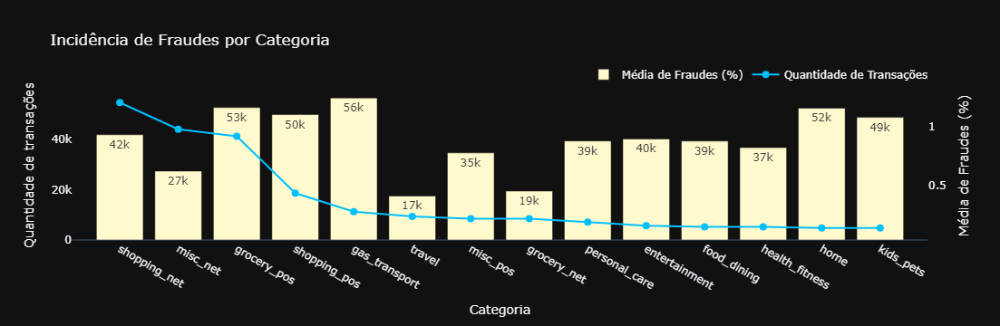

In [96]:
fig = go.Figure()

# Adicionando barras para a média de fraudes (%)
fig.add_trace(go.Bar(
    x=df_cat['category'],
    y=df_cat['qtd_trans'],
    name='Média de Fraudes (%)', 
    marker_color='lemonchiffon',
    text=df_cat['qtd_trans'].apply(lambda x: f'{x/1000:.0f}k'),
    textposition='auto'
))

# Adicionando linha para a quantidade de transações
fig.add_trace(go.Scatter(
    x=df_cat['category'],
    y=df_cat['mean_fraud'],
    name='Quantidade de Transações',
    mode='lines+markers',
    yaxis='y2',  # Define para o eixo secundário
    marker=dict(color='deepskyblue', size=8),
    line=dict(color='deepskyblue', width=2)
))

# Ajustando o layout
fig.update_layout(
    title='Incidência de Fraudes por Categoria',
    xaxis_title='Categoria',
    yaxis_title='Média de Fraudes (%)',
    yaxis=dict(title='Quantidade de transações', side='left', showgrid=False),
    yaxis2=dict(
        title='Média de Fraudes (%)',
        overlaying='y',  # Sobrepõe ao eixo y principal
        side='right',
        showgrid=False
    ),
    template='plotly_dark',
    legend=dict(
                x=0.6, 
                y=5,
        orientation='h')  # Posiciona a legenda
)

# Exibindo o gráfico
fig.show()

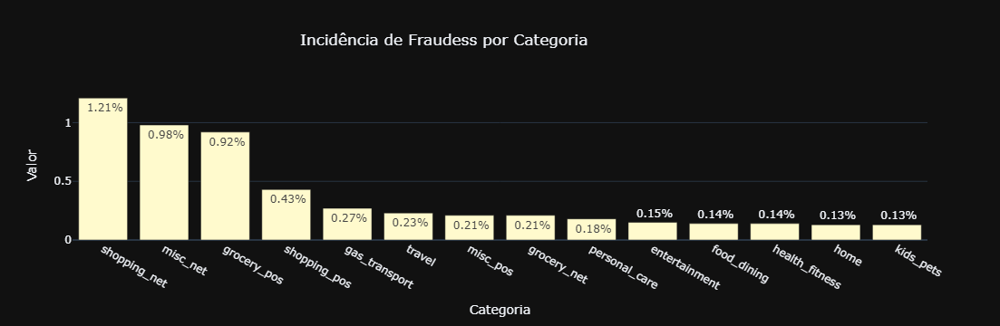

In [25]:
# Criando o gráfico de barras agrupadas
fig = go.Figure()

# Adicionando barras para cada métrica

fig.add_trace(go.Bar(
    x=df_cat['category'],
    y=df_cat['mean_fraud'],
    name='Média de Fraudes (%)', 
    marker_color='lemonchiffon',
    text=df_cat['mean_fraud'].apply(lambda x : f'{x: .2f}%',),
    textposition='auto'
))




# Ajustando o layout
fig.update_layout(
    title='Incidência de Fraudess por Categoria',
    title_x=0.3,
    xaxis_title='Categoria',
    yaxis_title='Valor',
template='plotly_dark'
)

# Exibindo o gráfico
fig.show()

#### 📌 Conclusão Fraude por Categoria de Compras 

- Ao analisar as **categorias**, observa-se que **compras online** (`shopping_net` e `misc_net`) possuem as **maiores taxas de fraude**:  
  - 🛒 **Shopping_net:** **1,21%**  
  - 💳 **Misc_net:** **0,98%**  
- Isso sugere que **transações online podem estar mais suscetíveis a fraudes**, possivelmente devido à **falta de verificação presencial** ou ao uso de **métodos de pagamento menos seguros**.  

- Além disso, **compras em mercados físicos** (`grocery_pos`) também apresentam uma **alta incidência de fraudes**:  
  - 🏪 **Grocery_pos:** **485 casos** e uma taxa de **0,92%**.  
  - Isso pode estar relacionado ao **alto volume de transações** nessa categoria ou a **vulnerabilidades específicas no processo de pagamento**.  

- Por outro lado, categorias como **`home`**, **`kids_pets`** e **`personal_care`** têm as **menores taxas de fraude**, indicando que **esses setores podem ser mais seguros ou menos visados por fraudadores**.  

💡 **Essa análise destaca a importância de reforçar medidas de segurança, especialmente em transações online e em mercados físicos, para reduzir a incidência de fraudes.**  


### 🔍 3. Qual o genero possue a maior quantidade de fraudes?

In [16]:
df_gender = df.groupby('gender').agg(
    qtd_trans = ('trans_num', 'count'),
    qtd_fraud = ('is_fraud', 'sum'),
    mean_fraud = ('is_fraud', lambda x: (x.mean()*100).round(2))
).assign(
    prop_trans= lambda x : (x['qtd_trans'] / x['qtd_trans'].sum()*100).round(2),
    prop_fraud= lambda x : (x['mean_fraud'] / x['mean_fraud'].sum()*100).round(2)
).reset_index()

In [17]:
df_gender

,gender,qtd_trans,qtd_fraud,mean_fraud,prop_trans,prop_fraud
0,F,304886,1164,0.38,54.86,49.35
1,M,250833,981,0.39,45.14,50.65


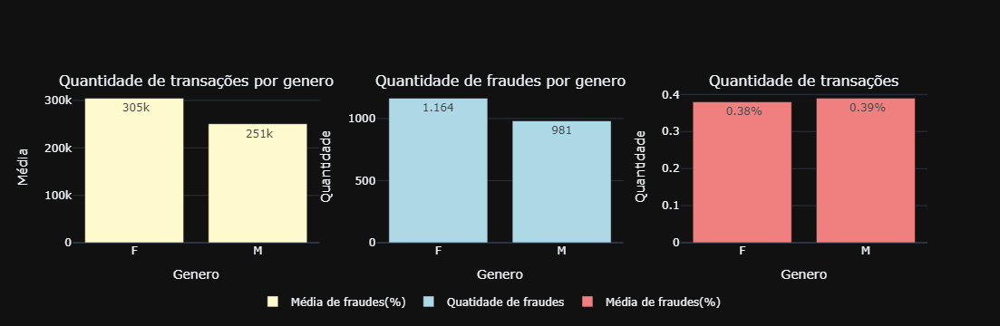

In [18]:
#Grafico de proporção de fraud entre genero

fig = make_subplots(rows=1, cols=3, subplot_titles=('Quantidade de transações por genero', 'Quantidade de fraudes por genero', 'Quantidade de transações'))



fig.add_trace(go.Bar(
    x=df_gender['gender'],
    y=df_gender['qtd_trans'],
    name='Média de fraudes(%)', 
    marker_color='lemonchiffon', 
    text=df_gender['qtd_trans'].apply(lambda x : f'{x/1000: .0f}k'),
    textposition='auto'), row=1, col=1)


fig.add_trace(go.Bar(
    x=df_gender['gender'],
    y=df_gender['qtd_fraud'], 
    name='Quatidade de fraudes',
    marker_color='lightblue',
    text=df_gender['qtd_fraud'].apply(lambda x : f'{x:,}'.replace(',',".")),
    textposition='auto'), row=1, col=2)



fig.add_trace(go.Bar(
    x=df_gender['gender'],
    y=df_gender['mean_fraud'],
    name='Média de fraudes(%)', 
    marker_color='lightcoral', 
    text=df_gender['mean_fraud'].apply(lambda x : f'{x: .2f}%'),
    textposition='auto'), row=1, col=3)


# Ajustando o layout
fig.update_layout(
    template='plotly_dark',
    showlegend=True, 
    legend=dict(
        x=0.213,
        y=-0.3,
        orientation='h'       
    ))

#Atualizar titulo dos eixos
fig.update_xaxes(title_text = 'Genero', row=1 ,col=1)
fig.update_yaxes(title_text = 'Média', row=1 ,col=1)
fig.update_xaxes(title_text = 'Genero', row=1 ,col=2)
fig.update_yaxes(title_text = 'Quantidade', row=1 ,col=2)
fig.update_xaxes(title_text = 'Genero', row=1 ,col=3)
fig.update_yaxes(title_text = 'Quantidade', row=1 ,col=3)


fig.show()

#### 📌 Conclusão Comparação por Gênero  

- O número total de transações de pessoas do gênero **F** (**305k**) é **maior** que o de pessoas do gênero **M** (**251k**).  
- A quantidade **absoluta** de fraudes para **F** (**1.164**) também é maior do que para **M** (**981**).  

- No entanto, a **média de fraudes** (ou taxa de fraude) é praticamente a mesma para ambos os grupos:  
  - **0,38% para F**  
  - **0,39% para M**  

**🔍 Como interpretar isso?**  

> A taxa de fraude sendo parecida indica que a **probabilidade de uma transação ser fraudulenta** não varia muito entre os gêneros.  
> O fato de **F** ter mais fraudes absolutas ocorre simplesmente porque **há mais transações desse grupo**.  


### 🔍4.  Existe algum padrão entre o horario da fraude?

In [19]:
#Converter a coluna de data e hore em datetime
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])

#Extrair hora formatada em H:M:S usanto strftime
df['hour'] = df['trans_date_trans_time'].dt.strftime('%H:%M:%S')

df['only_hour'] = df['trans_date_trans_time'].dt.strftime('%H')

In [20]:
df_hour = df.groupby('only_hour').agg(
    qtd_fraud = ('is_fraud', 'sum'),
    mean_fraud = ('is_fraud', lambda x: (x.mean()*100).round(2))
).reset_index().sort_values(by='mean_fraud', ascending=False)

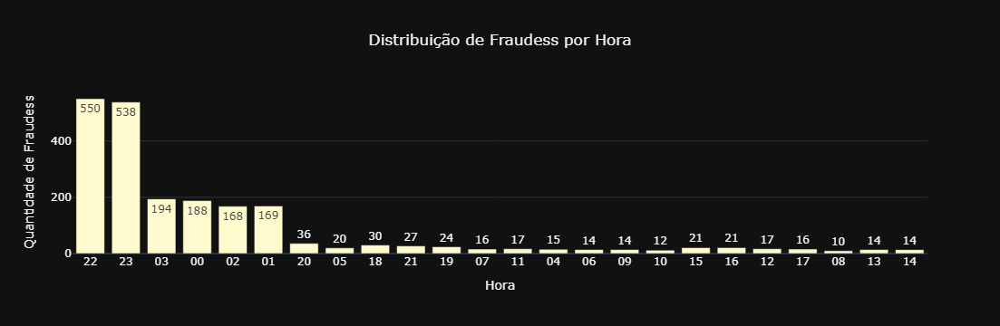

In [21]:
# Criando o gráfico
fig = go.Figure()

# Adicionando as barras
fig.add_trace(go.Bar(
    x=df_hour['only_hour'], 
    y=df_hour['qtd_fraud'], 
    name='Quantidade de Fraudess',
    marker_color='lemonchiffon',
    text=df_hour['qtd_fraud'],
    textposition='auto'
))

# Ajustando o layout
fig.update_layout(
    title='Distribuição de Fraudess por Hora',
    title_x = 0.5,
    xaxis_title='Hora',
    yaxis_title='Quantidade de Fraudess',
    template='plotly_dark'
)

# Exibindo o gráfico
fig.show()

#### 📌 Conclusão Pico de fraudes (hora)


**🔴 Pico de fraudes entre 22h e 23h:**  

- O maior índice de transações fraudulentas ocorre entre **22h e 23h**, com **550 e 538 fraudes**, respectivamente.  
- Isso indica um **período crítico** onde as fraudes são mais frequentes.  

**📉 Redução nas primeiras horas da madrugada:**  

- Entre **00h e 03h**, há uma redução significativa (**cerca de 65%**) no número de fraudes em comparação com o pico das **22h-23h**.  
- Isso sugere que, embora ainda haja uma incidência alta de fraudes nesse período, ela é **menor** do que no pico inicial.  

**🟢 Períodos de menor incidência:**  

- Das **04h às 21h**, a quantidade de fraudes é significativamente **menor**, com valores abaixo de **40 fraudes por hora**.  
- Isso indica que esses horários são **menos críticos**.  

**🔐 Ações de segurança:**  

- Aumentar os **critérios de segurança** durante os horários de pico (**22h-23h**) e nas primeiras horas da madrugada (**00h-03h**).  
- Isso pode incluir **verificação adicional de transações, autenticação de dois fatores ou monitoramento mais rigoroso**.  

**📊 Uso da variável para treinamento do modelo:**  

- A variável **`only_hour`** parece ter uma **alta correlação** com a ocorrência de fraudes, o que a torna uma **feature relevante** para o modelo de classificação.  
- Incluir essa variável pode **melhorar a precisão** do modelo ao prever transações fraudulentas.    
dulentas.


### 🔍 5.  Existe alguma relação a fraude e o dia da semana?

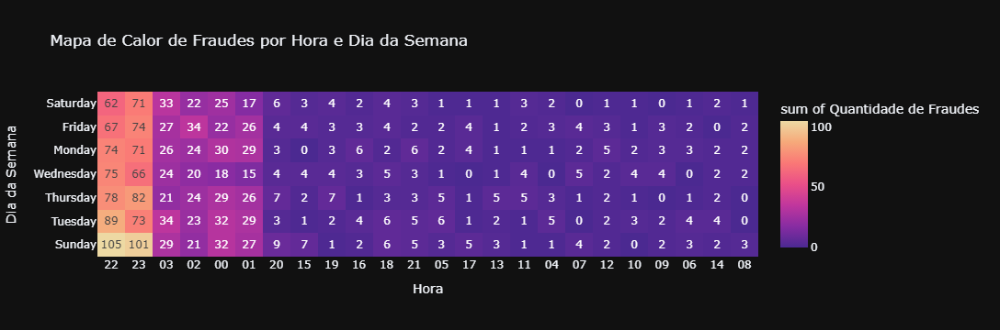

In [227]:
df_heatmap = df.groupby(['only_hour', 'day']).agg(
    qtd_fraud=('is_fraud', 'sum') 
).reset_index().sort_values(by= 'qtd_fraud', ascending=False)

fig = px.density_heatmap(
    df_heatmap,
    x='only_hour', 
    y='day',  
    z='qtd_fraud',  
    title='Mapa de Calor de Fraudes por Hora e Dia da Semana',
    labels={'only_hour': 'Hora', 'day': 'Dia da Semana', 'qtd_fraud': 'Quantidade de Fraudes'},
    color_continuous_scale='agsunset', 
    text_auto=True 
)

# Ajustando o layout
fig.update_layout(
    xaxis_title='Hora',
    yaxis_title='Dia da Semana',
    template='plotly_dark'
)

fig.show()

#### 📌Conclusão dia com maior numero de fraudes Domingo (Sunday)  

O domingo apresenta o maior pico de fraudes, com **105 fraudes às 22h** e **101 fraudes às 23h**.  

Outros dias da semana também mostram picos significativos, especialmente:  

- **Quinta-feira (Thursday):** 78 fraudes às 22h e 82 fraudes às 23h.  
- **Terça-feira (Tuesday):** 89 fraudes às 22h e 73 fraudes às   

---

**📊 Impacto do Dia da Semana**  

Embora o **domingo** tenha o maior número absoluto de fraudes, os outros dias da semana também apresentam picos consistentes, especialmente entre **22h e 23h**.  

📍 Isso sugere que **o horário tem um impacto mais significativo do que o dia emana**.  

---

**⏰ Horários de Pico**  

- Os horários entre **22h e 23h** são consistentemente os mais críticos em todos os dias da semana, com uma média de **70 a 100 fraudes** nesse período.  
- Fora desse horário, a quantidade de fraudes **cai drasticamente**, com a maioria dos dias registrando menos de **10 des por hora**.  

---

**✅ Recomendações**  

✔️ **Reforçar a segurança** durante os horários de pico (**22h-23h**) em todos os dias da semana.  
✔️ **Monitorar especialmente o domingo**, que apresenta os maiores picos de fraudes.  
✔️ **Considerar a implementação de verificações adicionais** ou **autenticação de dois fatores** durante esses horários críticos.  


### 🔍 6. Existe alguma relação a fraude e o mês?

In [107]:
df.columns

mes= { 1 : '01-jan', 2: '02-feb', 3: 'mar', 4: '04-apr', 5: '05-mai', 6: '06-jun', 
      7 : '07-jul', 8:'08-ago', 9: '09-sep', 10: '10-oct', 11: '11-nov', 12: '12-dec'}

df['month'] = df['trans_date_trans_time'].dt.month.map(mes)


**Vou utilizar uma métrica para tranduzir melhor a quantidade de fraudes a cada x transações.**
$$
x = qtd.transacoes / qdt.fraude 
$$

In [170]:
df_month = df.groupby('month').agg(
    qtd_trans = ('trans_num', 'count'),
    qtd_fraud = ('is_fraud', 'sum'),
    mean_fraud = ('is_fraud', lambda x  :(x.mean()*100).round(2)),
    total_preju = ('amt', lambda x: x[df['is_fraud']== 1].sum())
).assign(
    fraud_ratio = lambda x : (x['qtd_trans'] / x['qtd_fraud']).astype(int)
).reset_index().sort_values(by= 'month', ascending=True)

In [171]:
df_month

,month,qtd_trans,qtd_fraud,mean_fraud,total_preju,fraud_ratio
0,06-jun,30058,133,0.44,73274.93,226
1,07-jul,85848,321,0.37,158669.49,267
2,08-ago,88759,415,0.47,208785.43,213
3,09-sep,69533,340,0.49,202700.99,204
4,10-oct,69348,384,0.55,195572.97,180
5,11-nov,72635,294,0.40,153182.19,247
6,12-dec,139538,258,0.18,141138.68,540


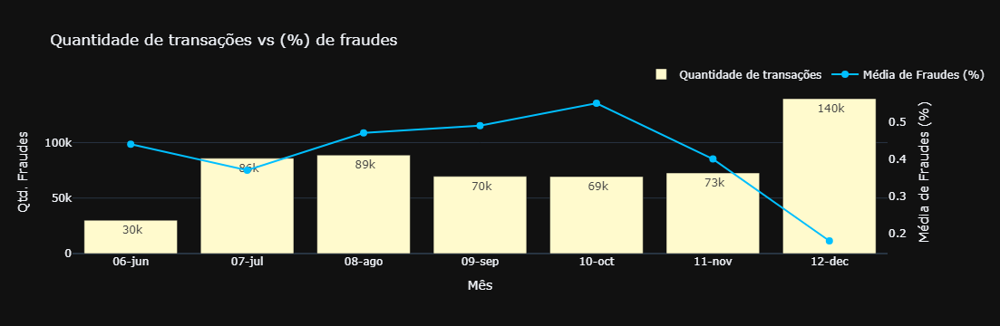

In [220]:
fig = go.Figure()


fig.add_trace(go.Bar(
    x=df_month['month'],
    y=df_month['qtd_trans'],
    name='Quantidade de transações',
    marker_color='lemonchiffon',
    text=df_month['qtd_trans'].apply(lambda x : f'{x/1000: .0f}k'),
    textposition='auto'    
))


fig.add_trace(go.Scatter(
    x=df_month['month'],
    y=df_month['mean_fraud'],
    name='Média de Fraudes (%)',
    mode='lines+markers',
    yaxis='y2',
    marker=dict(color='deepskyblue', size=8),
    line=dict(color='deepskyblue', width=2)
    
))


fig.update_layout(
    title='Quantidade de transações vs (%) de fraudes',
    xaxis_title='Mês',
    yaxis_title='Qtd. Fraudes',
    yaxis2=dict(
        title='Média de Fraudes (%)',
        overlaying='y',
        side='right',
        showgrid=False
    ),
    template= 'plotly_dark',
    legend=dict(
        x=0.7,
        y=6,
        orientation='h'
))


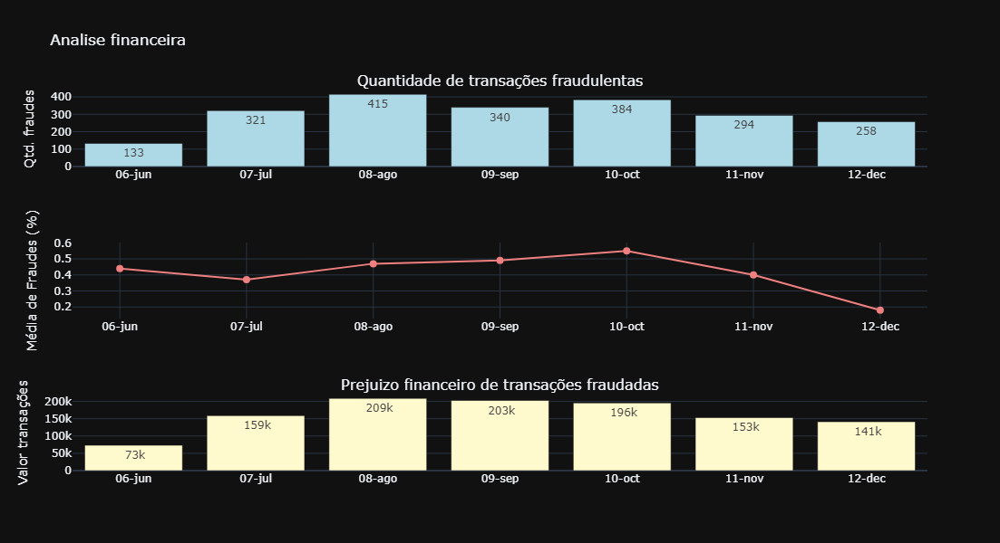

In [232]:
fig = make_subplots(rows=3, cols=1, subplot_titles=('Quantidade de transações fraudulentas', '','Prejuizo financeiro de transações fraudadas'), 
                    vertical_spacing=0.20)


fig.add_trace(go.Bar(
    x=df_month['month'],
    y=df_month['qtd_fraud'],
    marker_color= 'lightblue',
    text=df_month['qtd_fraud']), row=1, col=1)


fig.add_trace(go.Scatter(
    x=df_month['month'],
    y=df_month['mean_fraud'],
    name='Média de Fraudes (%)',
    mode='lines+markers',
    yaxis='y2',
    marker=dict(color='lightcoral', size=8),
    line=dict(color='lightcoral', width=2)),row=2, col=1)


fig.add_trace(go.Bar(
    x=df_month['month'],
    y=df_month['total_preju'],
    marker_color= 'lemonchiffon',
    text=df_month['total_preju'].apply(lambda x : f'{x/1000: .0f}k')), row=3, col=1)



# Ajustando o layout
fig.update_layout(
    height=600,
    title='Analise financeira',
    template='plotly_dark',
    showlegend=False,
    )

#Atualizar titulo dos eixos
fig.update_yaxes(title_text = 'Qtd. fraudes', row=1 ,col=1)
fig.update_yaxes(title_text = 'Média de Fraudes (%)', row=2 ,col=1)
fig.update_yaxes(title_text = 'Valor transações', row=3 ,col=1)


fig.show()

#### 📌 Conclusão quantidade de fraudes por mês:

1. **Junho:**
   - Em junho, foram realizadas **30 mil transações**, com uma **média de fraudes de 0,44%**. Isso significa que, a cada **226 transações legítimas**, **1 fraude** foi detectada, gerando um **prejuízo financeiro de 73 mil**.
   - Esse mês apresenta um **índice de fraudes moderado**, mas ainda assim relevante, considerando o volume total de transações.

2. **Outubro:**
   - Outubro registrou **69 mil transações**, com um **índice de fraudes de 0,55%**, o **maior entre os meses analisados**. Isso indica que, a cada **180 transações**, **1 era fraudulenta**.
   - Esse mês se destaca como o **período com maior risco de fraudes**, tanto em termos percentuais quanto absolutos.
   - O **prejuízo financeiro** foi de **196 mil**.

3. **Dezembro:**
   - Dezembro teve o **maior volume de transações (140 mil)**, mas o **menor índice de fraudes (0,18%)**. Isso significa que, a cada **540 transações**, apenas **1 era fraudulenta**.
   - Esse mês pode ser considerado o **mais seguro** em termos de fraudes, apesar do alto volume de transações.

---

#### 📌 Resumo:

- **Outubro** foi o mês com o **maior índice de fraudes**, com **1 fraude a cada 180 transações**. Esse período merece atenção especial, pois, além do alto percentual de fraudes, também teve um **volume significativo de transações**.
- **Dezembro**, apesar de ter o **maior volume de transações (140 mil)**, apresentou o **menor índice de fraudes (0,18%)**, sendo o mês mais seguro.
- **Junho** teve um **índice de fraudes moderado (0,44%)**, com **1 fraude a cada 226 transações**.

**Observação importante:** Como não temos dados completos para os meses de **janeiro a maio**, não é possível afirmar se outubro é realmente o mês com o maior índice de fraudes ao longo de todo o ano. No entanto, com base nos dados disponíveis, outubro se destaca como o período de maior risco.

# 📈 Analise preditiva